#  Data Structures- Space and Time Complexity
> Observing the time complexity of different algorithms
- toc: true
- image: /images/python.png
- categories: []
- type: pbl
- week: 27

# Space and Time Complexity
> Space complexity refers to the amount of memory used by an algorithm to complete its execution, as a function of the size of the input. The space complexity of an algorithm can be affected by various factors such as the size of the input data, the data structures used in the algorithm, the number and size of temporary variables, and the recursion depth. Time complexity refers to the amount of time required by an algorithm to run as the input size grows. It is usually measured in terms of the "Big O" notation, which describes the upper bound of an algorithm's time complexity.

> Why do you think a programmer should care about space and time complexity?
- A programmer should care about space and time complexity because taking up less space will allow the excess space to be used for other tasks. Since this algorithms will achieve the same goal, the algorithms working differently and producing different outputs will note be a problem. Also, the algorithm might take way too much time than available or too long for its purpose. Reducing the amount of time without changing the output would be useful.

Take a look at our lassen volcano example from the data compression tech talk. The first code block is the original image. In the second code block, change the baseWidth to rescale the image. 

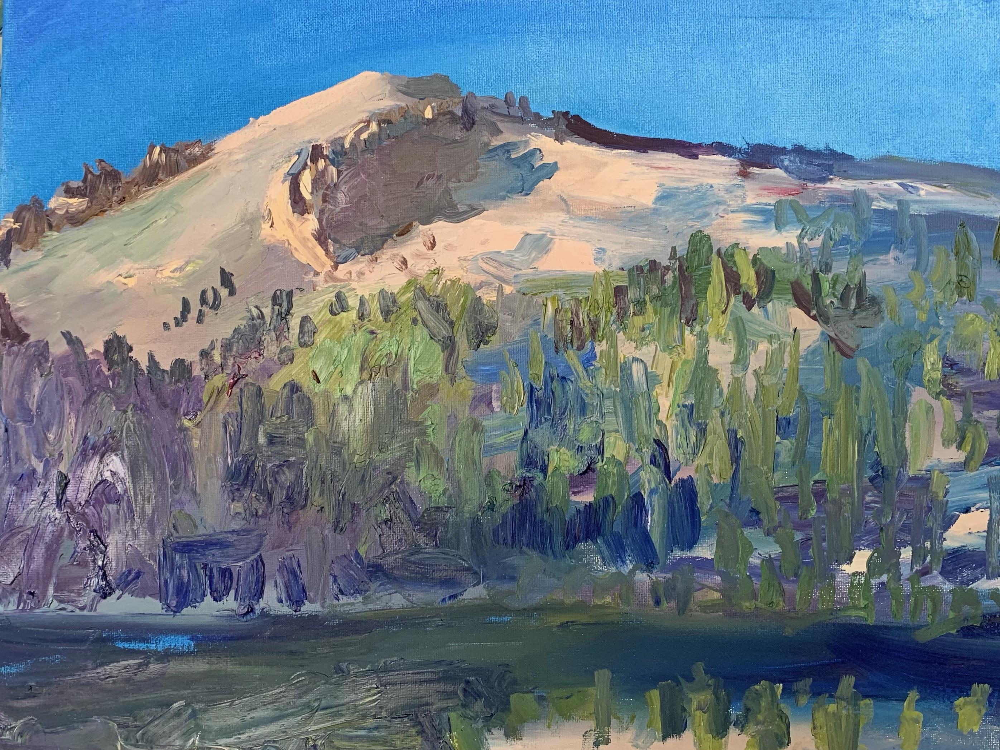

In [2]:
from IPython.display import Image, display
from pathlib import Path 

# prepares a series of images
def image_data(path=Path("images/"), images=None):  # path of static images is defaulted
    for image in images:
        # File to open
        image['filename'] = path / image['file']  # file with path
    return images

def image_display(images):
    for image in images:  
        display(Image(filename=image['filename']))

if __name__ == "__main__":
    lassen_volcano = image_data(images=[{'source': "Peter Carolin", 'label': "Lassen Volcano", 'file': "lassen-volcano.jpg"}])
    image_display(lassen_volcano)
    

In [3]:
from IPython.display import HTML, display
from pathlib import Path 
from PIL import Image as pilImage 
from io import BytesIO
import base64

# prepares a series of images
def image_data(path=Path("images/"), images=None):  # path of static images is defaulted
    for image in images:
        # File to open
        image['filename'] = path / image['file']  # file with path
    return images

def scale_image(img):
    #baseWidth = 625
    #baseWidth = 1250
    # baseWidth = 2500
    # baseWidth = 5000 # see the effect of doubling or halfing the baseWidth 
    baseWidth = 10000 
    #baseWidth = 20000
    #baseWidth = 40000
    scalePercent = (baseWidth/float(img.size[0]))
    scaleHeight = int((float(img.size[1])*float(scalePercent)))
    scale = (baseWidth, scaleHeight)
    return img.resize(scale)

def image_to_base64(img, format):
    with BytesIO() as buffer:
        img.save(buffer, format)
        return base64.b64encode(buffer.getvalue()).decode()
    
def image_management(image):  # path of static images is defaulted        
    # Image open return PIL image object
    img = pilImage.open(image['filename'])
    
    # Python Image Library operations
    image['format'] = img.format
    image['mode'] = img.mode
    image['size'] = img.size
    image['width'], image['height'] = img.size
    image['pixels'] = image['width'] * image['height']
    # Scale the Image
    img = scale_image(img)
    image['pil'] = img
    image['scaled_size'] = img.size
    image['scaled_width'], image['scaled_height'] = img.size
    image['scaled_pixels'] = image['scaled_width'] * image['scaled_height']
    # Scaled HTML
    image['html'] = '<img src="data:image/png;base64,%s">' % image_to_base64(image['pil'], image['format'])


if __name__ == "__main__":
    # Use numpy to concatenate two arrays
    images = image_data(images = [{'source': "Peter Carolin", 'label': "Lassen Volcano", 'file': "lassen-volcano.jpg"}])
    
    # Display meta data, scaled view, and grey scale for each image
    for image in images:
        image_management(image)
        print("---- meta data -----")
        print(image['label'])
        print(image['source'])
        print(image['format'])
        print(image['mode'])
        print("Original size: ", image['size'], " pixels: ", f"{image['pixels']:,}")
        print("Scaled size: ", image['scaled_size'], " pixels: ", f"{image['scaled_pixels']:,}")
        
        print("-- original image --")
        display(HTML(image['html'])) 


---- meta data -----
Lassen Volcano
Peter Carolin
JPEG
RGB
Original size:  (2792, 2094)  pixels:  5,846,448
Scaled size:  (10000, 7500)  pixels:  75,000,000
-- original image --


> Do you think this is a time complexity or space complexity or both problem? 
- I think this is both a time complexity and space complexity problem. This is a time complexity problem because since there are more pixels being generated when the image is larger, the value of n will be larger (in big o notation), making the amount of time needed to generate the output larger than if the image is smaller. Since the image has a greater number of pixels, more bits are needed to store the image making the space complexity larger as well. These are both problems because taking up too much space takes space away from other things that it could be used for and taking up too much time is bad in most situations.

## Big O Notation
- Constant O(1)
- Linear O(n)
- Quadratic O(n^2) 
- Logarithmic O(logn)
- Exponential (O(2^n))

In [4]:
#create a list called numbers with 1,000 numbers in it
numbers = list(range(1000))
print(numbers)


[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221,

# Constant O(1)

### Time
> An example of a constant time algorithm is accessing a specific element in an array. It does not matter how large the array is, accessing an element in the array takes the same amount of time. Therefore, the time complexity of this operation is constant, denoted by O(1).

In [5]:
#prints the number at index 263
print(numbers[263])

ncaa_bb_ranks = {1:"Alabama",2:"Houston", 3:"Purdue", 4:"Kansas"}
#look up a value in a dictionary given a key
print(ncaa_bb_ranks[1]) 

263
Alabama


### Space
> This function takes two number inputs and returns their sum. The function does not create any additional data structures or variables that are dependent on the input size, so its space complexity is constant, or O(1). Regardless of how large the input numbers are, the function will always require the same amount of memory to execute.

In [6]:
#function that takes the sum of two numbers
def sum(a, b): 
  return a + b

print(sum(90,88))
print(sum(.9,.88))

178
1.78


# Linear O(n)

### Time
> An example of a linear time algorithm is traversing a list or an array. When the size of the list or array increases, the time taken to traverse it also increases linearly with the size. Hence, the time complexity of this operation is O(n), where n is the size of the list or array being traversed.

In [7]:
#Iterates through the numbers list 
for i in numbers:
    print(i)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

### Space
> This function takes a list of elements arr as input and returns a new list with the elements in reverse order. The function creates a new list reversed_arr of the same size as arr to store the reversed elements. The size of reversed_arr depends on the size of the input arr, so the space complexity of this function is O(n). As the input size increases, the amount of memory required to execute the function also increases linearly.

In [8]:
def reverse_list(arr):
    n = len(arr) 
    reversed_arr = [None] * n #create a list of None based on the length or arr
    for i in range(n):
        reversed_arr[n-i-1] = arr[i] #stores the value at the index of arr to the value at the index of reversed_arr starting at the beginning for arr and end for reversed_arr 
    return reversed_arr

print(numbers)
print(reverse_list(numbers))

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221,

# Quadratic O(n^2)

### Time
> An example of a quadratic time algorithm is nested loops. When there are two nested loops that both iterate over the same collection, the time taken to complete the algorithm grows quadratically with the size of the collection. Hence, the time complexity of this operation is O(n^2), where n is the size of the collection being iterated over.

In [16]:
#Iterates through the list twice creating a nested loop
# for i in numbers:
#     for j in numbers:
        # print(i,j) Can't run this because I tried it committing the file after running it and the page crashed.

### Space
> This function takes two matrices matrix1 and matrix2 as input and returns their product as a new matrix. The function creates a new matrix result with dimensions m by n to store the product of the input matrices. The size of result depends on the size of the input matrices, so the space complexity of this function is O(n^2). As the size of the input matrices increases, the amount of memory required to execute the function also increases quadratically.

![Example of Matrix Multiplication](images/multiply_matrices.png)

- Main take away is that a new matrix is created.

In [10]:
def multiply_matrices(matrix1, matrix2):
    m = len(matrix1) 
    n = len(matrix2[0])
    result = [[0] * n] * m #this creates the new matrix based on the size of matrix 1 and 2
    for i in range(m):
        for j in range(n):
            for k in range(len(matrix2)):
                result[i][j] += matrix1[i][k] * matrix2[k][j]
    return result

print(multiply_matrices([[1,2],[3,4]], [[3,4],[1,2]]))

[[18, 28], [18, 28]]


# Logarithmic O(logn)

### Time
> An example of a log time algorithm is binary search. Binary search is an algorithm that searches for a specific element in a sorted list by repeatedly dividing the search interval in half. As a result, the time taken to complete the search grows logarithmically with the size of the list. Hence, the time complexity of this operation is O(log n), where n is the size of the list being searched.

In [11]:
#function used to search for a target using a binary search
def binary_search(arr, low, high, target):
    while low <= high:
        mid = (low + high) // 2 #integer division
        if arr[mid] == target:
            return mid
        elif arr[mid] < target:
            low = mid + 1
        else:
            high = mid - 1

target = 263
result = binary_search(numbers, 0, len(numbers) - 1, target)

print(result)


263


### Space
> The same algorithm above has a O(logn) space complexity. The function takes an array arr, its lower and upper bounds low and high, and a target value target. The function searches for target within the bounds of arr by recursively dividing the search space in half until the target is found or the search space is empty. The function does not create any new data structures that depend on the size of arr. Instead, the function uses the call stack to keep track of the recursive calls. Since the maximum depth of the recursive calls is O(logn), where n is the size of arr, the space complexity of this function is O(logn). As the size of arr increases, the amount of memory required to execute the function grows logarithmically.

# Exponential O(2^n)

### Time
> An example of an O(2^n) algorithm is the recursive implementation of the Fibonacci sequence. The Fibonacci sequence is a series of numbers where each number is the sum of the two preceding ones, starting from 0 and 1. The recursive implementation of the Fibonacci sequence calculates each number by recursively calling itself with the two preceding numbers until it reaches the base case (i.e., the first or second number in the sequence). The algorithm takes O(2^n) time in the worst case because it has to calculate each number in the sequence by making two recursive calls.

![A visualization of calculating the fibonacci sequence](images/fibonacci.webp)

In [12]:
#recursive function to calculate the fibonacci number at n
def fibonacci(n):
    if n <= 1:
        return n
    else:
        return fibonacci(n-1) + fibonacci(n-2)

#print(fibonacci(5))
#print(fibonacci(10))
#print(fibonacci(20))
# print(fibonacci(30))
print(fibonacci(40))

102334155


### Space
> This function takes a set s as input and generates all possible subsets of s. The function does this by recursively generating the subsets of the set without the first element, and then adding the first element to each of those subsets to generate the subsets that include the first element. The function creates a new list for each recursive call that stores the subsets, and each element in the list is a new list that represents a subset. The number of subsets that can be generated from a set of size n is 2^n, so the space complexity of this function is O(2^n). As the size of the input set increases, the amount of memory required to execute the function grows exponentially.

In [13]:
def generate_subsets(s):
    if not s:
        return [[]]
    subsets = generate_subsets(s[1:])
    return [[s[0]] + subset for subset in subsets] + subsets

print(generate_subsets([1, 2, 3, 4, 5, 6]))
#print(generate_subsets(numbers))

[[1, 2, 3, 4, 5, 6], [1, 2, 3, 4, 5], [1, 2, 3, 4, 6], [1, 2, 3, 4], [1, 2, 3, 5, 6], [1, 2, 3, 5], [1, 2, 3, 6], [1, 2, 3], [1, 2, 4, 5, 6], [1, 2, 4, 5], [1, 2, 4, 6], [1, 2, 4], [1, 2, 5, 6], [1, 2, 5], [1, 2, 6], [1, 2], [1, 3, 4, 5, 6], [1, 3, 4, 5], [1, 3, 4, 6], [1, 3, 4], [1, 3, 5, 6], [1, 3, 5], [1, 3, 6], [1, 3], [1, 4, 5, 6], [1, 4, 5], [1, 4, 6], [1, 4], [1, 5, 6], [1, 5], [1, 6], [1], [2, 3, 4, 5, 6], [2, 3, 4, 5], [2, 3, 4, 6], [2, 3, 4], [2, 3, 5, 6], [2, 3, 5], [2, 3, 6], [2, 3], [2, 4, 5, 6], [2, 4, 5], [2, 4, 6], [2, 4], [2, 5, 6], [2, 5], [2, 6], [2], [3, 4, 5, 6], [3, 4, 5], [3, 4, 6], [3, 4], [3, 5, 6], [3, 5], [3, 6], [3], [4, 5, 6], [4, 5], [4, 6], [4], [5, 6], [5], [6], []]


> Using the time library, we are able to see the difference in time it takes to calculate the fibonacci function above.
- Based on what is known about the other time complexities, hypothesize the resulting elapsed time if the function is replaced. 

In [14]:
import time

start_time = time.time()
print(fibonacci(34))
end_time = time.time()

total_time = end_time - start_time
print("Time taken:", total_time, "seconds")

start_time = time.time()
print(fibonacci(35))
end_time = time.time()

total_time = end_time - start_time
print("Time taken:", total_time, "seconds")


5702887
Time taken: 1.6604831218719482 seconds
9227465
Time taken: 2.617706060409546 seconds


# Hacks
- Record your findings when testing the time elapsed of the different algorithms.

Different algorithms of different time complexities took different amounts of time to run. The algorithms with larger time complexities (with similar input size values (n)) took longer to run while the algorithms with smaller time complexities took less time to run. For me, the difference in time elapsed ranged from 0.0 sec (many algorithms) to 3 min and 3.5 sec (quadratic time algorithm).

- Although we will go more in depth later, time complexity is a key concept that relates to the different sorting algorithms. Do some basic research on the different types of sorting algorithms and their time complexity.

The following table highlights a few examples of sorting algorithms and their time complexities.

| Name of Sorting Algorithm | Time Complexity | Big O Notation (Worst-Case) |
|---------------------------|-----------------|-----------------------------|
| Selection Sort | Exponential | O(n^2) |
| Bubble Sort | Exponential | O(n^2) |
| Heap Sort | Logarithmic | O(nlog n) |
| Merge Sort | Logarithmic | O(nlog n) |
| Quick Sort | Exponential | O(n^2) |

- Why is time and space complexity important when choosing an algorithm?

Time complexity is important when choosing and algorithm because in most cases, the output should be outputted in the least amount of time possible. For example, if the user want to use a calculator program during a test, there are time constraints for the test so the output needs to be displayed as soon as possible. Space complexity is also important because of something takes up less space than the same output for another algorithm which has larger time complexity, that extra space could be saved to store something else. For example if 2 songs can be stored in a certain number of bits in one algorithm and 5 songs can be stored in the same amount of space in another algorithm, it would be more practical to use the latter as more songs would be stored in the same amount of space.

- Should you always use a constant time algorithm / Should you never use an exponential time algorithm? Explain?

Even though it would be amazing if constant time could always be used as it generally takes less time than any other type of algorithm (assuming that the value of n is the same), this is not possible because the majority of algorithms can't be created with constant time. Many require larger time complexities like logarithmic and exponential. Some sorting algorithms that require logarithmic and exponential time complexities are selection sort, heap sort, merge sort, bubble sort, and quick sort (the sorting algorithms listed in the table above). Since these algorithms can't be created with smaller time complexities, these larger time complexities need to be used.

- What are some general patterns that you noticed to determine each algorithm's time and space complexity?

Since n is a factor when determining how long it will take for an algorithm to execute, I saw that when you increase the size of an image or increase the size of a list, the time it takes for the program to be executed will be longer even when nothing else is changed. This is usually because having a longer list means more items need to be iterated through making it take longer. Or in the example of the image, more pixels need to be generated making the program take longer to be executed. I also noticed that the program that took the longest to execute was the one in exponential time which makes sense because this is the largest time complexity. Also the larger images or larger lists have larger space complexity because more bits are needed to store the larger amount of data.

Complete the Time and Space Complexity analysis questions linked below.
[Practice](https://www.geeksforgeeks.org/practice-questions-time-complexity-analysis/)

### Question 1

![Question 1](images/TandS-Complexity-Practice1.png)

**Answer and Explanation:** The answer is choice 3. Time Complexity: The time complexity is O(N+M) because the first for loops iterates N time while the second for loop iterates M times. All of these iterations need to be accounted for making the time complexity O(N+M). Space Complexity: Since there are only 2 variables (a and b), the space complexity is constant (O(1)).

### Question 2

![Question 2](images/TandS-Complexity-Practice2.png)

**Answer and Explanation:** The answer is choice 4 because there are nested for loops.

### Question 3

![Question 3](images/TandS-Complexity-Practice3.png)

**Answer and Explanation:** Even though this might seem like another algorithm in exponential time, the answer is actually choice 2 (O(nLogn)) because the variable j in the nested for loop doubles every iteration.

### Question 4

![Question 4](images/TandS-Complexity-Practice4.png)

**Answer and Explanation:** The answer is choice 2 because when one algorithm is asymptotically more efficient than another algorithm, it takes less time and is therefore better than the other algorithm.

### Question 5

![Question 5](images/TandS-Complexity-Practice5.png)

**Answer and Explanation:** The answer is choice 4 (time complexity of O(logN)) because of how i is halved each iteration.

### Question 6

![Question 6](images/TandS-Complexity-Practice6.png)

**Answer and Explanation:** The answer is choice 3 (both time and memory are useful criterion for comparing the efficiency of algorithms) because they can be seen as time complexity (time) and space complexity (memory). Time complexity can show the efficiency of an algorithm because the algorithm that takes the least amount of time while producing the same output is the most efficient. Space complexity can show the efficiency of an algorithm because the algorithm with an output that takes up the least number of bits while producing the same output is the most efficient.

### Question 7

![Question 7](images/TandS-Complexity-Practice7.png)

**Answer and Explanation:** The answer is choice 2 ("By counting the number of primitive operations performed by the algorithm on a given input size."). This explains how time complexity is measured because the more steps that are performed, the greater amount of time it will take for the algorithm to be executed. Additionally the given input size can be seen as n in big o notation.

### Question 8

![Question 8](images/TandS-Complexity-Practice8.png)

**Answer and Explanation:** The answer is choice 3 (O(logkn)) because i is multiplied by k every iteration and the number of iterations required for i to be greater than n can be found by solving the equation k^x = n, where x is the number of iterations.

### Question 9

![Question 9](images/TandS-Complexity-Practice9.png)

**Answer and Explanation:** The answer is choice 3 because there are n(n-1)/2 total iterations in the inner nested loop making the time complexity n(n-1).

### Question 10

![Question 10](images/TandS-Complexity-Practice10.png)

**Answer and Explanation:** The answer is false because the time it takes for the algorithm to run also depends on the value of n. If the value of n is higher in algorithm B, it could take longer for algorithm B to run than algorithm A.